# Introduction

This file is meant to evaluate and extract explanations of the Synthetic dataset for multiclass classification using the classifiers without applying Grid Search methods to discover the best hyperparameters for the context. This file analyses the results only with one train/test partition. 

Note: The complete run of this file should take less than 10 minutes.

# Imports

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import json
import time
import lime.lime_tabular
import shap
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from interpret.glassbox import ExplainableBoostingClassifier
from interpret import show
from sklearn.model_selection import train_test_split
from SyntheticDataset import SyntheticDataset
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from DatasetAnalysis import DatasetAnalysis
from PerformanceAnalysis import PerformanceAnalysis
from Visualization import Visualization

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)


# Setup

In [2]:
config_file = open('configs\\config.json')
config_vars = json.load(config_file)
config_file.close()

logs_dir = config_vars["logs_dir"] + "/synth_multi_baseline"

if not os.path.exists(logs_dir):
    os.makedirs(logs_dir)

In [3]:
config_file = open('configs\\visual_config.json')
visual_vars = json.load(config_file)
config_file.close()

shap_colors_neg = visual_vars["shap_colors"]["negative"]
shap_colors_pos = visual_vars["shap_colors"]["positive"]
shap_colors = np.array([tuple(shap_colors_neg), tuple(shap_colors_pos)])

title_size = visual_vars["title_font_size"]
label_size = visual_vars["labels_font_size"]

green_color = tuple([x/255 for x in visual_vars["green_colors"]["c2"]])

# Multi-Class Classification

## Create the Dataset

In [4]:
min_val = -100
max_val = 100
num_rows = 1500
num_features = 10
num_classes = 10
rand_coef_class = 0.05
rand_coef = []
for i in range(num_features):
    coef = [0.9 for x in range(num_classes)]
    coef[i % num_classes] = rand_coef_class
    rand_coef.append(coef)

# Each variable contributes to one class, the one with the same number (e.g. Var0 -> Class 0, Var1 -> Class 1)

std_dev = np.array([1.75 - (0.1 * i) for i in range(num_features)])
class_sep = np.ones(10) * 0.65

features_names = ["Var" + (str(x)) for x in range(num_features)]

# Uncomment to use randomness coefficients
# dataset = SyntheticDataset(min_val, max_val, num_rows, num_features, num_classes, rand_coef, seed=42)
dataset = SyntheticDataset(min_val, max_val, num_rows, num_features, num_classes, norm_dist=True, seed=42, std_dev_perc=std_dev, class_sep_perc=class_sep)
dataset.generate()
dataset.get_data()

array([[-54.9449674 , -64.72924407, -45.59343213, ..., -60.4619879 ,
        -60.4700972 ,   0.        ],
       [-70.63314791, -65.37063749, -51.39384742, ..., -58.11850424,
        -52.70306692,   0.        ],
       [-49.74473605, -43.92338598, -38.18334946, ..., -66.35812098,
        -57.33923058,   0.        ],
       ...,
       [ 45.0823359 ,  84.14127139,  36.2588865 , ...,  56.13351657,
         51.6044113 ,   9.        ],
       [ 66.8063986 ,  67.5139233 ,  60.98435399, ...,  63.42699519,
         52.89196834,   9.        ],
       [ 44.71607754,  54.82467193,  53.33111313, ...,  61.55060873,
         54.80297076,   9.        ]])

In [5]:
X = dataset.get_x()
y = dataset.get_y()

In [6]:
rand_coef

[[0.05, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9],
 [0.9, 0.05, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9],
 [0.9, 0.9, 0.05, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9],
 [0.9, 0.9, 0.9, 0.05, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9],
 [0.9, 0.9, 0.9, 0.9, 0.05, 0.9, 0.9, 0.9, 0.9, 0.9],
 [0.9, 0.9, 0.9, 0.9, 0.9, 0.05, 0.9, 0.9, 0.9, 0.9],
 [0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.05, 0.9, 0.9, 0.9],
 [0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.05, 0.9, 0.9],
 [0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.05, 0.9],
 [0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.9, 0.05]]

In [7]:
std_dev

array([1.75, 1.65, 1.55, 1.45, 1.35, 1.25, 1.15, 1.05, 0.95, 0.85])

In [8]:
data_analysis = DatasetAnalysis()

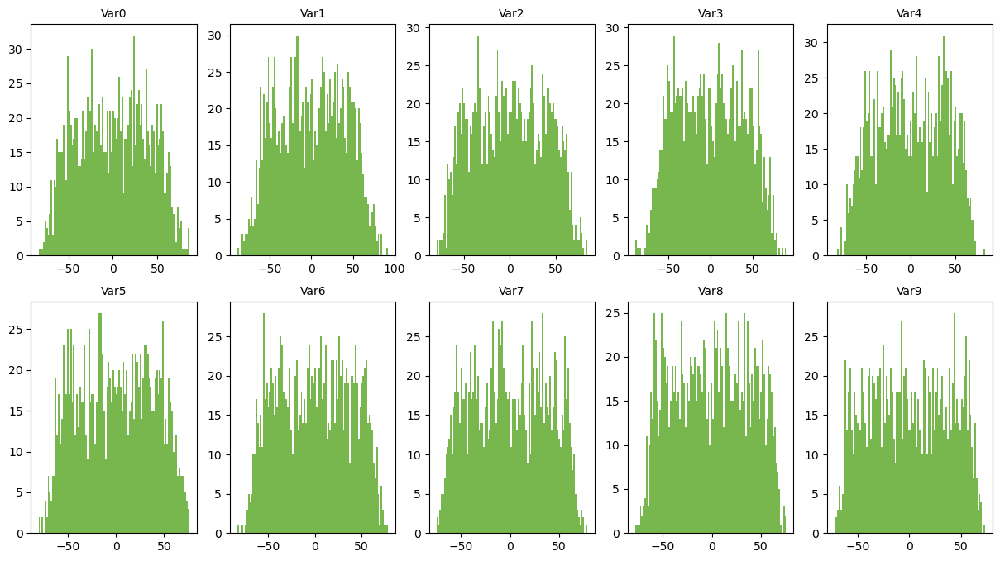

In [10]:
data_analysis.feat_hist(dataset.get_x(), n_rows=2, n_cols=5, figsize=(15, 8), color=green_color, feat_names=features_names, bins=100)

plt.savefig(f"{logs_dir}/synth_multi_vars_dist.png", bbox_inches="tight")

plt.show()

## Split the Dataset

In [9]:
X_train, X_test, Y_train, Y_test = train_test_split(
    X, y, test_size=0.20, shuffle=True, stratify=y, random_state=42)

Y_train = [int(x) for x in Y_train]
Y_test = [int(x) for x in Y_test]

X_train_pd = pd.DataFrame(X_train, columns=features_names)
X_test_pd = pd.DataFrame(X_test, columns=features_names)

## Instance to extract local explanations for all models

In [10]:
Exp_index = 5
Exp_inst = X_test[Exp_index, :]
Exp_inst_pd = X_test_pd.iloc[Exp_index, :]
Exp_inst_class = Y_test[Exp_index]
print(f"Instance:\n{Exp_inst_pd}\n\nClass: {Exp_inst_class}") #"Name" and "dtype" are not part of the instance, they must be ignored

Instance:
Var0    28.322895
Var1    29.457853
Var2    10.840468
Var3    21.154101
Var4    16.495001
Var5    19.188972
Var6     6.543320
Var7    15.331624
Var8    24.017714
Var9    19.603738
Name: 5, dtype: float64

Class: 6


# Classification

In [11]:
perf_analysis = PerformanceAnalysis()

## <i>Logistic Regression</i> (LR)

In [12]:
lr_clf = LogisticRegression(solver="lbfgs", max_iter=1000, C=0.01, random_state=42).fit(X_train, Y_train)

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression


Accuracy: 98.3%


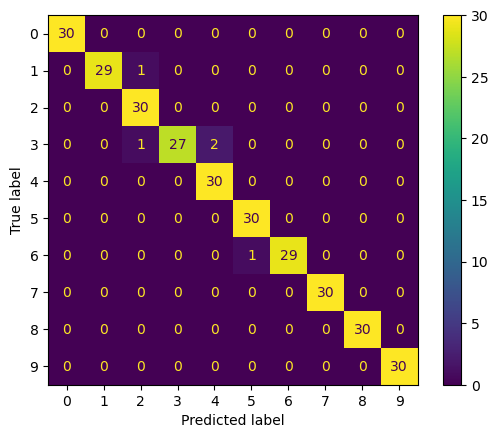

In [13]:
lr_ye = lr_clf.predict(X_test)
lr_cm = confusion_matrix(Y_test, lr_ye)

lr_acc = 1 - (np.sum(Y_test != lr_ye) / len(Y_test))
print(f"Accuracy: {round(lr_acc, 3) * 100}%")

ConfusionMatrixDisplay.from_predictions(Y_test, lr_ye)

plt.show()

In [14]:
plt.figure(figsize=(7,5))

lr_accs = perf_analysis.acc_for_class(lr_cm, colors=green_color, title="Logistic Regression")

plt.show()

<Figure size 700x500 with 0 Axes>

### Extract Explanations

#### Local

##### Local - <i>Local Model-Agnostic Explanations</i> (LIME)

In [15]:
lr_LIME_explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=features_names, random_state=42)
lr_LIME_explanation = lr_LIME_explainer.explain_instance(Exp_inst, lr_clf.predict_proba, labels=[Exp_inst_class])

In [16]:
lr_LIME_explanation.show_in_notebook(show_table=True)

##### <i>SHapley Additive exPlanations</i> (SHAP)

In [17]:
shap.initjs()

In [18]:
lr_shap_init = time.time()
lr_SHAP_exp = shap.KernelExplainer(lr_clf.predict_proba, shap.sample(X_train_pd, 20, random_state=42), random_state=42)
lr_shap_loc_values = np.array(lr_SHAP_exp.shap_values(Exp_inst_pd))

In [19]:
shap.force_plot(lr_SHAP_exp.expected_value[6], lr_shap_loc_values[6, :], Exp_inst_pd)

#### Global (SHAP)

In [20]:
shap.initjs()

In [21]:
lr_shap_global_values = lr_SHAP_exp.shap_values(X_test_pd)
lr_shap_fin = time.time()
lr_shap_dur = lr_shap_fin - lr_shap_init

  0%|          | 0/300 [00:00<?, ?it/s]

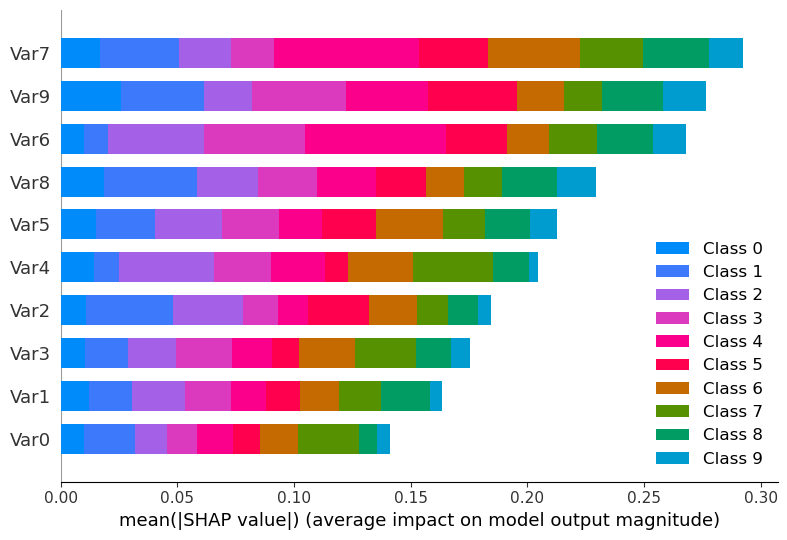

In [22]:
shap.summary_plot(lr_shap_global_values, X_test_pd, plot_type="bar", class_inds="original")


## <i>Random Forest</i> (RF)

In [23]:
rf_clf = RandomForestClassifier(n_estimators=1000, bootstrap=False, max_features="sqrt", random_state=42).fit(X_train, Y_train)

Accuracy: 97.0%


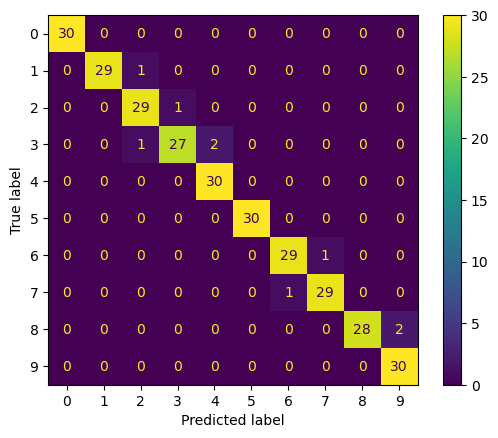

In [24]:
rf_ye = rf_clf.predict(X_test)
rf_cm = confusion_matrix(Y_test, rf_ye)

rf_acc = 1 - (np.sum(Y_test != rf_ye) / len(Y_test))
print(f"Accuracy: {round(rf_acc, 3) * 100}%")

ConfusionMatrixDisplay.from_predictions(Y_test, rf_ye)

plt.show()

In [25]:
plt.figure(figsize=(7,5))

rf_accs = perf_analysis.acc_for_class(rf_cm, colors=green_color, title="Random Forest")

plt.show()

<Figure size 700x500 with 0 Axes>

### Extract Explanations


##### Local - <i>Local Model-Agnostic Explanations</i> (LIME)

In [26]:
rf_LIME_explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=features_names)
rf_LIME_explanation = rf_LIME_explainer.explain_instance(Exp_inst, rf_clf.predict_proba, labels=[Exp_inst_class])

In [27]:
rf_LIME_explanation.show_in_notebook(show_table=True)

##### <i>SHapley Additive exPlanations</i> (SHAP)

In [28]:
rf_shap_init = time.time()
rf_SHAP_exp = shap.TreeExplainer(rf_clf)
rf_shap_loc_values = np.array(rf_SHAP_exp.shap_values(Exp_inst_pd))

In [29]:
shap.force_plot(rf_SHAP_exp.expected_value[Exp_inst_class], rf_shap_loc_values[Exp_inst_class, :], Exp_inst_pd)

#### Global (SHAP)

In [30]:
rf_shap_global_values = rf_SHAP_exp.shap_values(X_test_pd)

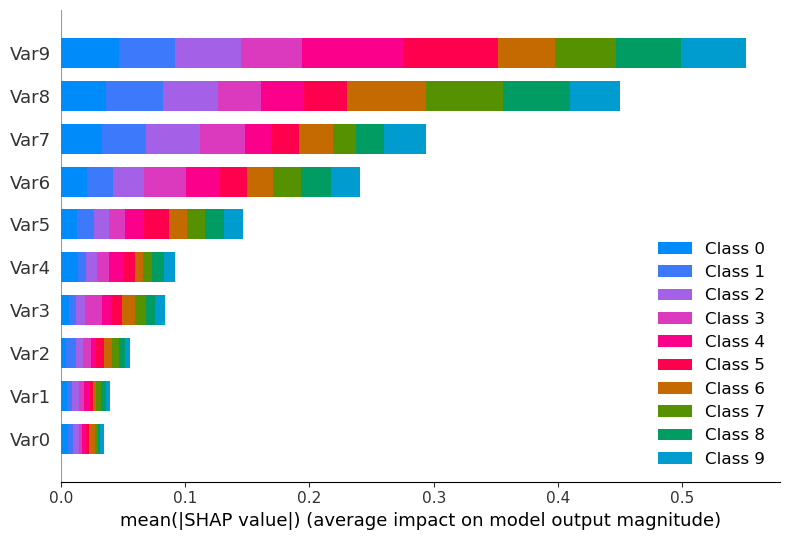

In [31]:
shap.summary_plot(rf_shap_global_values, X_test_pd, plot_type="bar", class_inds="original")
rf_shap_fin = time.time()
rf_shap_dur = rf_shap_fin - rf_shap_init

# <i>Support Vector Machines</i> (SVM)

In [32]:
svm_clf = SVC(kernel="rbf", C=1, cache_size=1000, decision_function_shape="ovo", gamma="scale", probability=True, random_state=42).fit(X_train, Y_train)

Accuracy: 98.3%


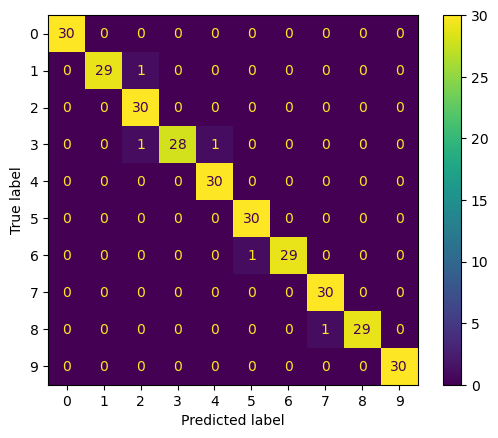

In [33]:
svm_ye = svm_clf.predict(X_test)
svm_cm = confusion_matrix(Y_test, svm_ye)

svm_acc = 1 - (np.sum(Y_test != svm_ye) / len(Y_test))
print(f"Accuracy: {round(svm_acc, 3) * 100}%")

ConfusionMatrixDisplay.from_predictions(Y_test, svm_ye)

plt.show()

In [34]:
plt.figure(figsize=(7,5))

svm_accs = perf_analysis.acc_for_class(svm_cm, colors=green_color, title="Support Vector Machines")

plt.show()

<Figure size 700x500 with 0 Axes>

### Extract Explanations


#### Local

##### <i>Local Model-Agnostic Explanations</i> (LIME)

In [35]:
svm_LIME_explainer = lime.lime_tabular.LimeTabularExplainer(X_train, feature_names=features_names, random_state=42)
svm_LIME_explanation = svm_LIME_explainer.explain_instance(Exp_inst, svm_clf.predict_proba, labels=[Exp_inst_class])

In [36]:
svm_LIME_explanation.show_in_notebook(show_table=True)

##### <i>SHapley Additive exPlanations</i> (SHAP)

In [37]:
svm_shap_init = time.time()
svm_SHAP_exp = shap.KernelExplainer(svm_clf.predict_proba, shap.sample(X_train_pd, 20, random_state=42), random_state=42)
svm_shap_loc_values = np.array(svm_SHAP_exp.shap_values(Exp_inst_pd))

In [38]:
shap.force_plot(svm_SHAP_exp.expected_value[Exp_inst_class], svm_shap_loc_values[Exp_inst_class, :], Exp_inst_pd)

#### Global (SHAP)

In [39]:
svm_shap_global_values = svm_SHAP_exp.shap_values(X_test_pd)
svm_shap_fin = time.time()
svm_shap_dur = svm_shap_fin - svm_shap_init

  0%|          | 0/300 [00:00<?, ?it/s]

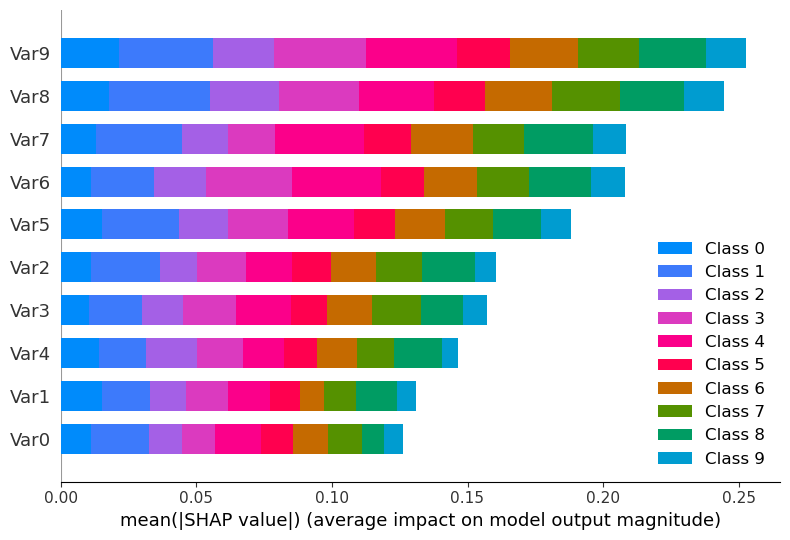

In [40]:
shap.summary_plot(svm_shap_global_values, X_test_pd, plot_type="bar", class_inds="original")

## <i>Explainable Boosting Machine</i> (EBM)

In [41]:
ebm_clf = ExplainableBoostingClassifier(max_bins=1024, smoothing_rounds=500, cyclic_progress=0, interactions=0, random_state=42).fit(X_train_pd, Y_train)

Accuracy: 99.0%


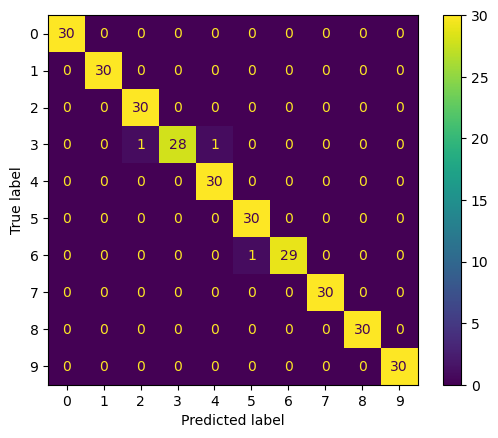

In [42]:
ebm_ye = ebm_clf.predict(X_test)
ebm_cm = confusion_matrix(Y_test, ebm_ye)

ebm_acc = 1 - (np.sum(Y_test != ebm_ye) / len(Y_test))
print(f"Accuracy: {round(ebm_acc, 3) * 100}%")

ConfusionMatrixDisplay.from_predictions(Y_test, ebm_ye)

plt.show()

In [43]:
plt.figure(figsize=(7,5))

ebm_accs = perf_analysis.acc_for_class(ebm_cm, colors=green_color, title="Explainable Boosting Machine")

plt.show()

<Figure size 700x500 with 0 Axes>

### Extract Explanations

In [44]:
ebm_global = ebm_clf.explain_global()
show(ebm_global)

<!-- http://127.0.0.1:7001/1799816754256/ -->

In [45]:
ebm_local = ebm_clf.explain_local(X_test, Y_test)
show(ebm_local)

<!-- http://127.0.0.1:7001/1799791830928/ -->

# Summary

In [47]:
visual = Visualization()

## Metrics

In [48]:
lr_metrics = lr_accs.rename(columns={0: "LR"})
lr_metrics["LR"] = [round(x, 2) for x in lr_metrics["LR"]]
rf_metrics = rf_accs.rename(columns={0: "RF"})
rf_metrics["RF"] = [round(x, 2) for x in rf_metrics["RF"]]
svm_metrics = svm_accs.rename(columns={0: "SVM"})
svm_metrics["SVM"] = [round(x, 2) for x in svm_metrics["SVM"]]
ebm_metrics = ebm_accs.rename(columns={0: "EBM"})
ebm_metrics["EBM"] = [round(x, 2) for x in ebm_metrics["EBM"]]
avr_accs = [lr_acc, rf_acc, svm_acc, ebm_acc]

overall_metrics = pd.concat([lr_metrics, rf_metrics, svm_metrics, ebm_metrics], axis=1)
display(overall_metrics)

Classes,LR,RF,SVM,EBM
0,1.00,1.00,1.00,1.00
1,0.97,0.97,0.97,1.00
2,1.00,0.97,1.00,1.00
3,0.90,0.90,0.93,0.93
4,1.00,1.00,1.00,1.00
5,1.00,1.00,1.00,1.00
6,0.97,0.97,0.97,0.97
7,1.00,0.97,1.00,1.00
8,1.00,0.93,0.97,1.00
9,1.00,1.00,1.00,1.00


In [49]:
latex_str = overall_metrics.columns.name  + ''.join([" & " + x for x in overall_metrics.columns]) + " \\\ \n"

In [50]:
for i, row in overall_metrics.iterrows():
    
    aux_str = str(i)
    for k in row:
        aux_str += f" & {k}"
    
    latex_str += aux_str + " \\\ \n"

with open(f"{logs_dir}/synth_multi_metrics.txt", "w") as text_file:
    print(latex_str, file=text_file)

## Confusion Matrices

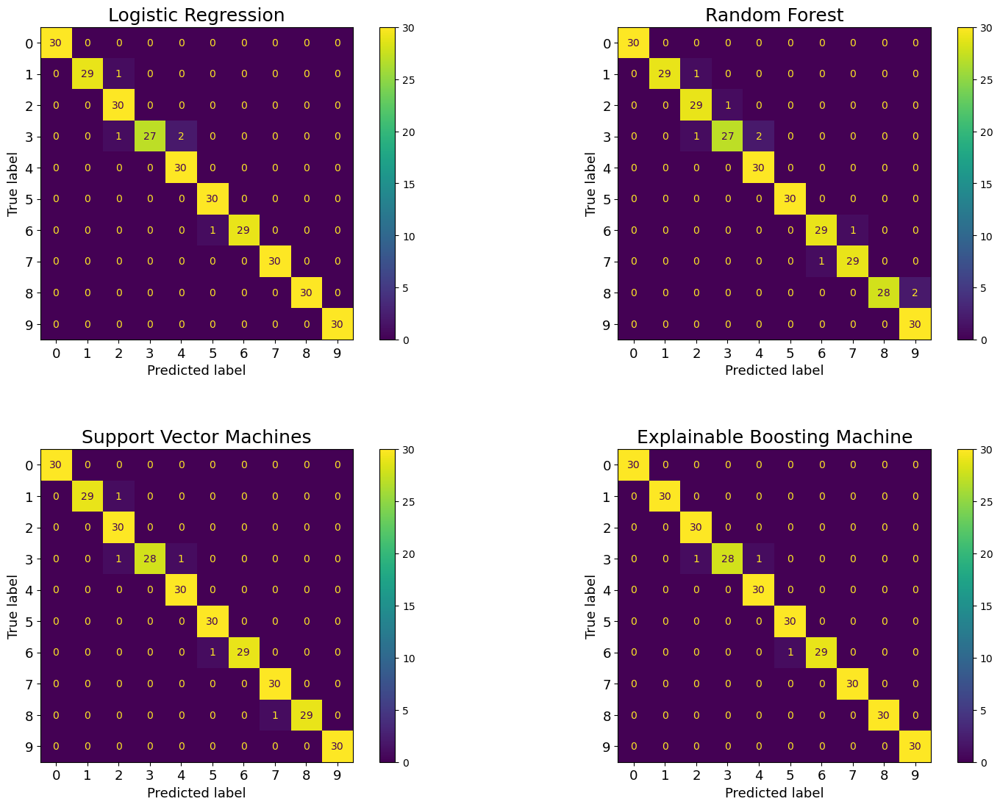

In [51]:
visual.confusion_matrices([Y_test, Y_test, Y_test, Y_test],
                          [lr_ye, rf_ye, svm_ye, ebm_ye],
                          nrows=2, 
                          ncols=2, 
                          figsize=(15,10),
                          title_size=title_size,
                          label_size=label_size,
                          titles=["Logistic Regression", "Random Forest", "Support Vector Machines", "Explainable Boosting Machine"])

plt.savefig(f"{logs_dir}/synth_multi_conf_matrices.png", bbox_inches="tight")

plt.show()

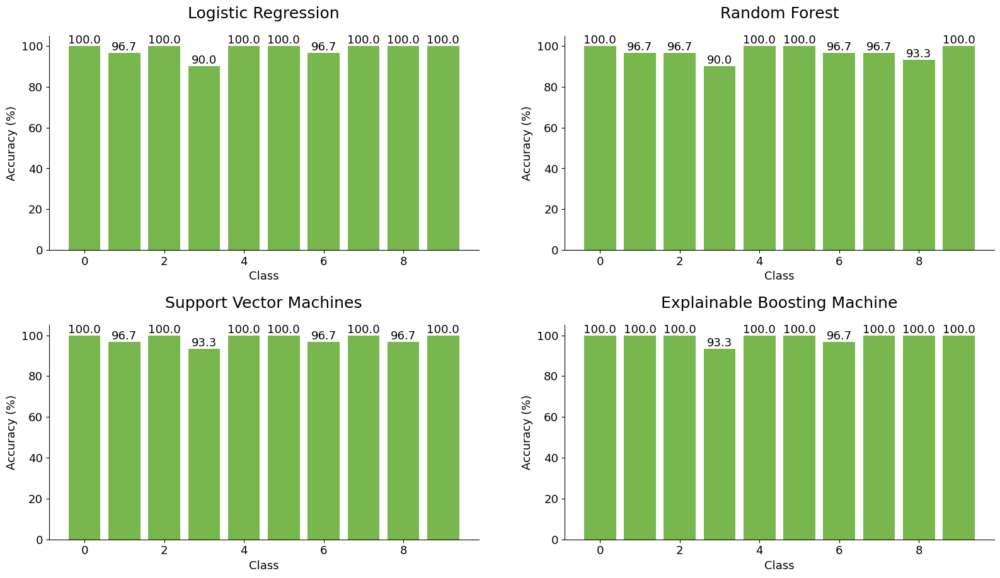

In [52]:
visual.acc_classes([lr_cm, rf_cm, svm_cm, ebm_cm],
                  nrows=2, 
                  ncols=2, 
                  figsize=(15,8),
                  title_size=title_size,
                  label_size=label_size,
                  colors=[green_color, green_color, green_color, green_color],
                  titles=["Logistic Regression", "Random Forest", "Support Vector Machines", "Explainable Boosting Machine"])

plt.savefig(f"{logs_dir}/synth_multi_acc_classes.png", bbox_inches="tight")

plt.show()

## Local Explanations

### LIME

In [53]:
lr_LIME_explanation.show_in_notebook(show_table=True)
lr_LIME_explanation.save_to_file(f"{logs_dir}/synth_multi_LR_LIME.html")

In [54]:
rf_LIME_explanation.show_in_notebook(show_table=True)
rf_LIME_explanation.save_to_file(f"{logs_dir}/synth_multi_RF_LIME.html")

In [55]:
svm_LIME_explanation.show_in_notebook(show_table=True)
svm_LIME_explanation.save_to_file(f"{logs_dir}/synth_multi_SVM_LIME.html")

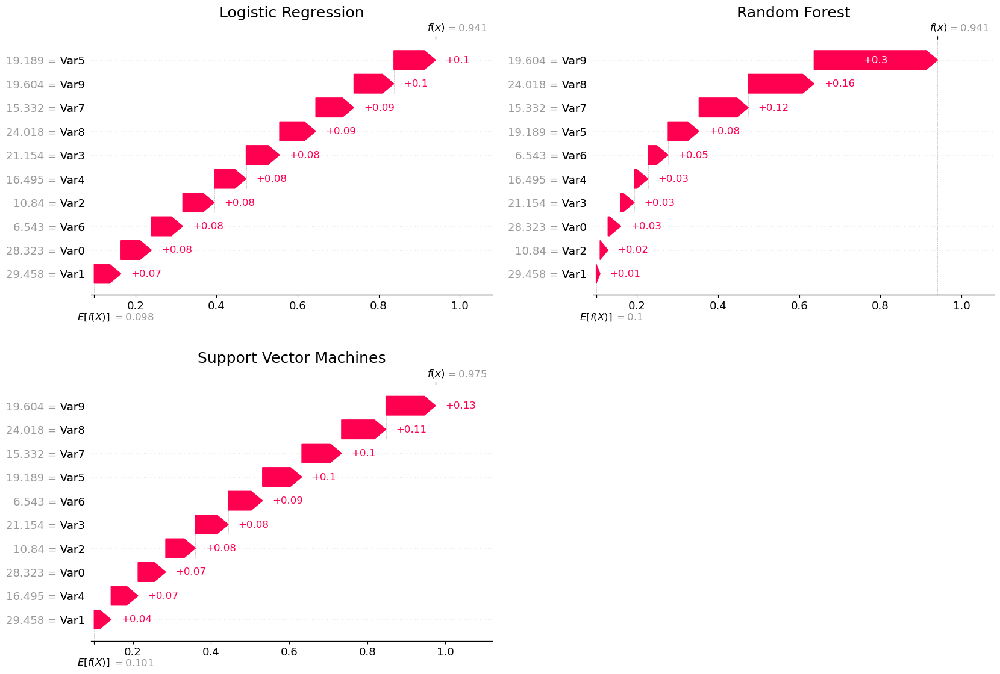

In [56]:
explanations = [shap.Explanation(lr_shap_loc_values[Exp_inst_class, :], lr_SHAP_exp.expected_value[Exp_inst_class], data=Exp_inst_pd),
                shap.Explanation(rf_shap_loc_values[Exp_inst_class, :], rf_SHAP_exp.expected_value[Exp_inst_class], data=Exp_inst_pd),
                shap.Explanation(svm_shap_loc_values[Exp_inst_class, :], svm_SHAP_exp.expected_value[Exp_inst_class], data=Exp_inst_pd)]


visual.local_shap(explanations, 
                  None,
                  nrows = 2,
                  ncols = 2,
                  figsize = (15,10),
                  title_size = title_size,
                  label_size = label_size,
                  titles = ["Logistic Regression", "Random Forest", "Support Vector Machines"],
                  ebm_colors = shap_colors/255)

plt.savefig(f"{logs_dir}/synth_bin_local_SHAP_EBM.png", bbox_inches="tight")

plt.show()


## Global Explanations

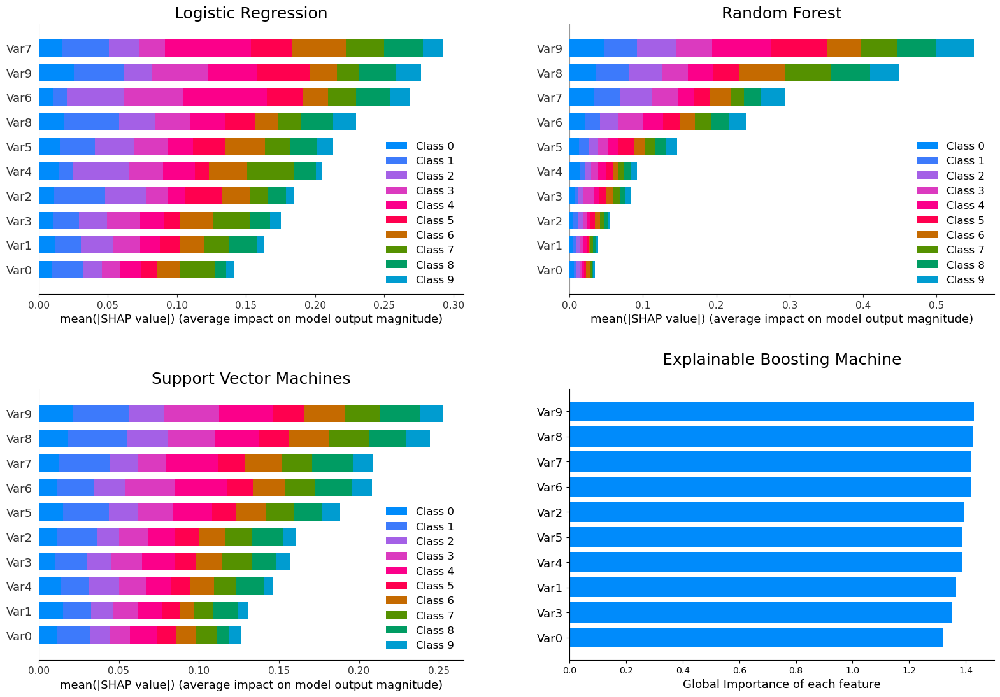

In [57]:
global_shap_values = [lr_shap_global_values,
                      rf_shap_global_values,
                      svm_shap_global_values]

visual.global_shap(global_shap_values,
                  X_test_pd,
                  ebm_global.data(),
                  nrows = 2,
                  ncols = 2,
                  figsize = (15,10),
                  title_size = title_size,
                  label_size = label_size,
                  titles = ["Logistic Regression", "Random Forest", "Support Vector Machines"],
                  ebm_colors = shap_colors/255)

plt.savefig(f"{logs_dir}/synth_multi_global_SHAP_EBM.png", bbox_inches="tight")

plt.show()